In [1]:
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from glob import glob
from keras.layers import Flatten,Dense
from keras.applications.vgg16 import VGG16
import xml.etree.ElementTree as xet
from keras.models import load_model,Sequential
from sklearn.model_selection import train_test_split

In [2]:
def load_images(directory):
    images = []
    
    for filepath in tqdm(os.listdir(directory)):
        img_path = os.path.join(directory,filepath)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        #img = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
        img = cv2.resize(img,(244,244))
        img = cv2.medianBlur(img,5)
        images.append(img)
        
    images = np.array(images).reshape(len(images),244,244,3)#ORIN 224
    return images

In [3]:
path = glob(r"annotations\*.xml")
labels_dict = dict(filepath=[],xmin=[],xmax=[],ymin=[],ymax=[])

for filename in path:
    data = xet.parse(filename)
    root = data.getroot()
    obj = root.find("object")
    labels_info = obj.find("bndbox")
    xmin = int(labels_info.find("xmin").text)
    xmax = int(labels_info.find("xmax").text)
    ymin = int(labels_info.find("ymin").text)
    ymax = int(labels_info.find("ymax").text)
    labels_dict["filepath"].append(filename)
    labels_dict["xmin"].append(xmin)
    labels_dict["xmax"].append(xmax)
    labels_dict["ymin"].append(ymin)
    labels_dict["ymax"].append(ymax)

In [4]:
df = pd.DataFrame(labels_dict)
df.to_csv("labels.csv",index=False)
df.head()

,filepath,xmin,xmax,ymin,ymax
0,E:\development\AnacondaProjects\CNN\Convolutio...,226,419,125,173
1,E:\development\AnacondaProjects\CNN\Convolutio...,134,262,128,160
2,E:\development\AnacondaProjects\CNN\Convolutio...,140,303,5,148
3,E:\development\AnacondaProjects\CNN\Convolutio...,175,214,114,131
4,E:\development\AnacondaProjects\CNN\Convolutio...,167,240,202,220


In [5]:
import os
images = load_images(r"images")
images.shape

  0%|          | 0/433 [00:00<?, ?it/s]

(433, 244, 244, 3)

In [6]:
filename = df["filepath"][0]
def getFilename(filename):
    filename_image = xet.parse(filename).getroot().find("filename").text
    filepath_image = os.path.join(r"images",filename_image)
    return filepath_image
getFilename(filename)

'E:\\development\\AnacondaProjects\\CNN\\Convolutional3\\numberPlates\\images\\Cars0.png'

In [7]:
image_path = list(df['filepath'].apply(getFilename))
image_path[:10]

['E:\\development\\AnacondaProjects\\CNN\\Convolutional3\\numberPlates\\images\\Cars0.png',
 'E:\\development\\AnacondaProjects\\CNN\\Convolutional3\\numberPlates\\images\\Cars1.png',
 'E:\\development\\AnacondaProjects\\CNN\\Convolutional3\\numberPlates\\images\\Cars10.png',
 'E:\\development\\AnacondaProjects\\CNN\\Convolutional3\\numberPlates\\images\\Cars100.png',
 'E:\\development\\AnacondaProjects\\CNN\\Convolutional3\\numberPlates\\images\\Cars101.png',
 'E:\\development\\AnacondaProjects\\CNN\\Convolutional3\\numberPlates\\images\\Cars102.png',
 'E:\\development\\AnacondaProjects\\CNN\\Convolutional3\\numberPlates\\images\\Cars103.png',
 'E:\\development\\AnacondaProjects\\CNN\\Convolutional3\\numberPlates\\images\\Cars104.png',
 'E:\\development\\AnacondaProjects\\CNN\\Convolutional3\\numberPlates\\images\\Cars105.png',
 'E:\\development\\AnacondaProjects\\CNN\\Convolutional3\\numberPlates\\images\\Cars106.png']

In [8]:
igm = cv2.imread("images\\Cars0.png")
igm.shape

(268, 500, 3)

In [9]:
bbox_coords = df.iloc[:,1:].values
labels = []

for ind in range(len(image_path)):
    image = image_path[ind]
    img_arr = cv2.imread(image)
    h,w,d = img_arr.shape
    xmin,xmax,ymin,ymax = bbox_coords[ind]
    nxmin,nxmax = int(xmin/(w/255.)),int(xmax/(w/255.))
    nymin,nymax = int(ymin/(h/255.)),int(ymax/(h/255.))
    # labels.append((xmin,xmax,ymin,ymax))
    labels.append((nxmin,nxmax,nymin,nymax))

In [10]:
X = np.array(images,dtype=np.float32)
y = np.array(labels,dtype=np.float32)

In [11]:
X = X/255.
y = y/255.

In [12]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)
X_train,X_val,y_train,y_val = train_test_split(X_train,y_train,test_size=0.1,random_state=42)

In [13]:
model = Sequential()
model.add(VGG16(weights="imagenet",include_top=False,input_shape=(244,244,3)))
model.add(Flatten())
model.add(Dense(128,activation="relu"))
model.add(Dense(128,activation="relu"))
model.add(Dense(64,activation="relu"))
model.add(Dense(4,activation="sigmoid"))

model.layers[-6].trainable = False
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 128)               3211392   
                                                                 
 dense_1 (Dense)             (None, 128)               16512     
                                                                 
 dense_2 (Dense)             (None, 64)                8256      
                                                                 
 dense_3 (Dense)             (None, 4)                 260       
                                                                 
Total params: 17,951,108
Trainable params: 3,236,420
Non

In [14]:
model.compile(loss="mean_squared_error",optimizer="adam",metrics=["accuracy"])

In [15]:
r = model.fit(X_train,y_train,epochs=50,batch_size=32,validation_data=(X_val,y_val),verbose=1)

Epoch 1/50
10/10 [==============================] - 95s 9s/step - loss: 0.0853 - accuracy: 0.5209 - val_loss: 0.0799 - val_accuracy: 0.6000
Epoch 2/50
10/10 [==============================] - 91s 9s/step - loss: 0.0685 - accuracy: 0.5048 - val_loss: 0.0538 - val_accuracy: 0.6571
Epoch 3/50
10/10 [==============================] - 93s 9s/step - loss: 0.0532 - accuracy: 0.6977 - val_loss: 0.0477 - val_accuracy: 0.6857
Epoch 4/50
10/10 [==============================] - 93s 9s/step - loss: 0.0283 - accuracy: 0.6720 - val_loss: 0.0143 - val_accuracy: 0.7143
Epoch 5/50
10/10 [==============================] - 93s 9s/step - loss: 0.0131 - accuracy: 0.7363 - val_loss: 0.0161 - val_accuracy: 0.6571
Epoch 6/50
10/10 [==============================] - 93s 9s/step - loss: 0.0076 - accuracy: 0.8457 - val_loss: 0.0153 - val_accuracy: 0.7143
Epoch 7/50
10/10 [==============================] - 97s 10s/step - loss: 0.0048 - accuracy: 0.8810 - val_loss: 0.0153 - val_accuracy: 0.7429
Epoch 8/50
10/10 [=

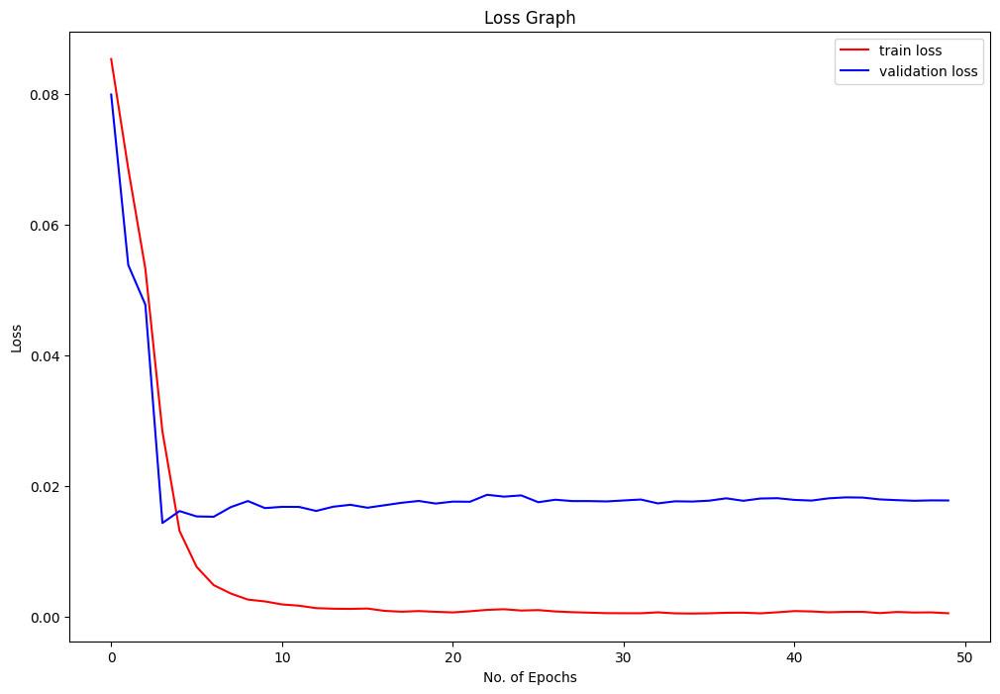

In [16]:
plt.figure(figsize=(12,8))
plt.plot(r.history['loss'],'r',label='train loss')
plt.plot(r.history['val_loss'],'b',label='validation loss')
plt.xlabel('No. of Epochs')
plt.ylabel('Loss')
plt.title('Loss Graph')
plt.legend()

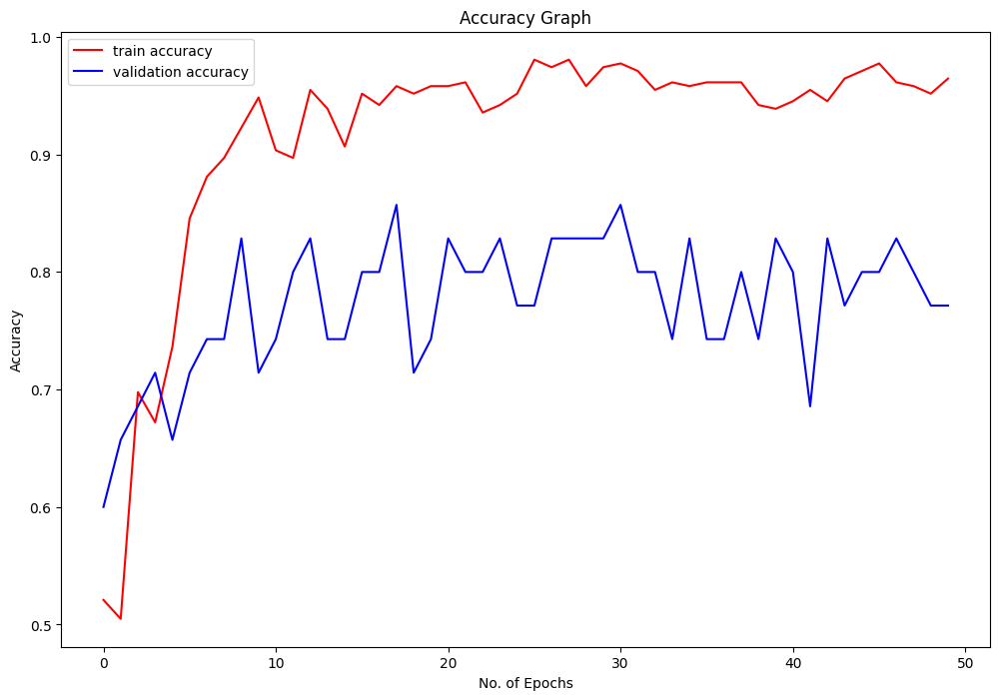

In [17]:
plt.figure(figsize=(12,8))
plt.plot(r.history['accuracy'],'r',label='train accuracy')
plt.plot(r.history['val_accuracy'],'b',label='validation accuracy')
plt.xlabel('No. of Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy Graph')
plt.legend()

In [18]:
loss, acc = model.evaluate(X_test,y_test)
print("Test Loss:",loss)
print("Test Accuracy:",acc)

3/3 [==============================] - 22s 7s/step - loss: 0.0084 - accuracy: 0.7586
Test Loss: 0.008382842876017094
Test Accuracy: 0.7586206793785095


In [19]:
pred_pass2 = model.predict(X_test)

3/3 [==============================] - 22s 7s/step


In [20]:
from tensorflow.keras.preprocessing.image import load_img,img_to_array
path = r"test_image\test_image.jpg"
image = load_img(path)
image = np.array(image,dtype=np.uint8)

image1 = load_img(path,target_size=(244,244))
image_arr_224 = img_to_array(image1)/255.0

h,w,d = image.shape
print("Height of the image = ",h)
print("Width of the image = ",w)

Height of the image =  1280
Width of the image =  2560


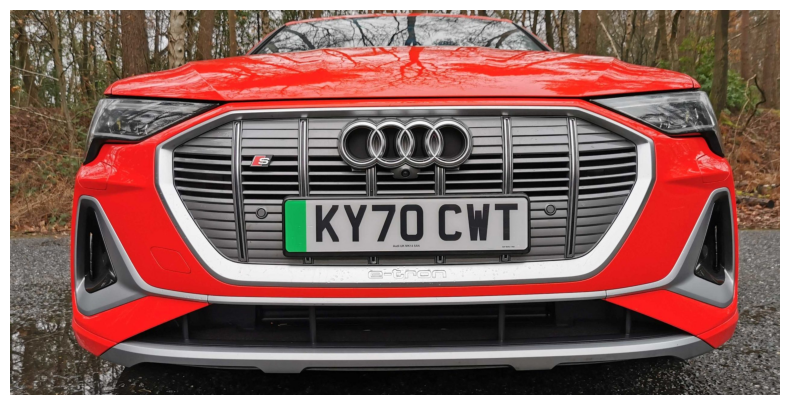

In [21]:
fig,axs = plt.subplots(figsize=(10,5))
axs.axis('off')
plt.imshow(image)
plt.show()

In [22]:
image_arr_224.shape

(244, 244, 3)

In [23]:
test_arr = image_arr_224.reshape(1,244,244,3)
test_arr.shape

(1, 244, 244, 3)

In [24]:
coords = model.predict(test_arr)
coords

1/1 [==============================] - 0s 274ms/step


array([[0.2763886 , 0.6196759 , 0.44827393, 0.6921072 ]], dtype=float32)

In [25]:
denorm = np.array([w,w,h,h])
coords = coords * denorm
coords

array([[ 707.55477905, 1586.37023926,  573.79062653,  885.8972168 ]])

In [26]:
xmin,xmax,ymin,ymax = coords[0]
pt1 = [xmin,ymin]
pt2 = [xmax,ymax]
print(pt1,pt2)

[707.5547790527344, 573.7906265258789] [1586.3702392578125, 885.897216796875]



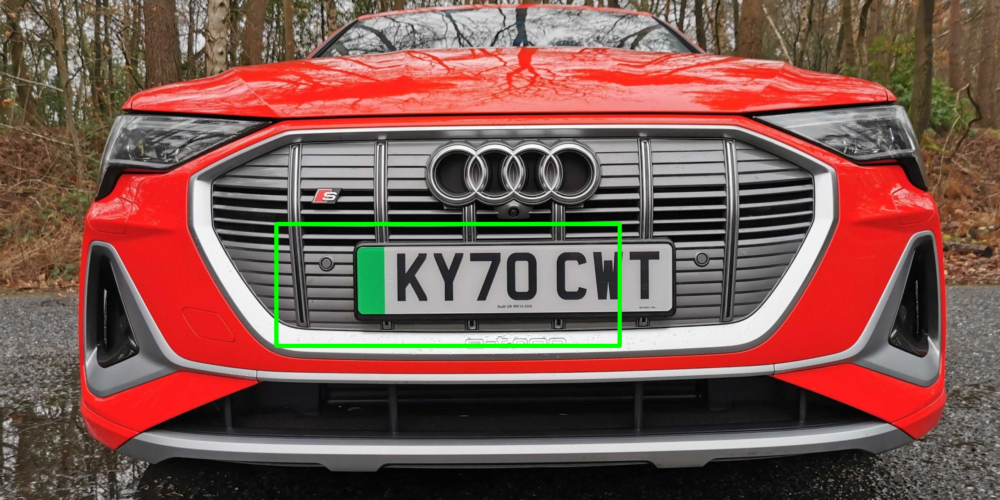

In [27]:
import plotly.express as px
cv2Img = cv2.imread(path)
cv2ImgRGB = cv2.cvtColor(cv2Img,cv2.COLOR_BGR2RGB)
#cv2ImgResize = cv2.resize(cv2ImgRGB,(244,244))
cv2.rectangle(cv2ImgRGB,(int(pt1[0]),int(pt1[1])),(int(pt2[0]),int(pt2[1])),(0,255,0),10)
fig = px.imshow(cv2ImgRGB)
fig.update_layout(width=700,height=500,margin=dict(l=10,r=10,b=10,t=10))


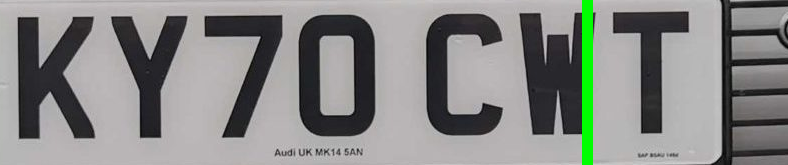

In [28]:
cropped = cv2ImgRGB[632:797,999:1787]
fig = px.imshow(cropped)
fig.update_layout(width=700,height=500,margin=dict(l=10,r=10,b=10,t=10))

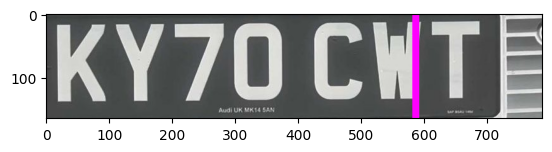

In [29]:
gray_inverted = cv2.bitwise_not(cropped)
plt.imshow(gray_inverted,cmap="gray")

In [30]:
cv2.imwrite("gray_inverted.jpg",gray_inverted)
gray_inverted = cv2.imread("gray_inverted.jpg")

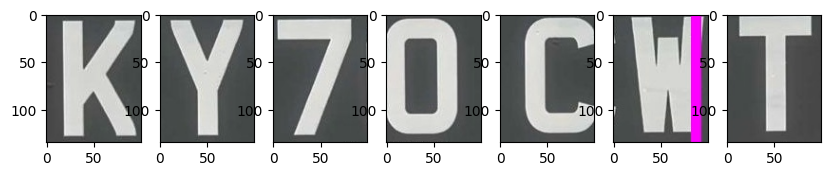

In [31]:
startX = 0
imgDict = []
for dim in range(int(int(gray_inverted.shape[1])/100)):
    char = gray_inverted[10:int(gray_inverted.shape[0]-20),int(startX):int(startX+100)]
    startX+=100
    #char = cv2.resize(char,(28,28))
    imgDict.append(char)

fig1 = plt.figure(figsize=(10,7))
row = 1
columns = 7

for i in range(columns):
    fig1.add_subplot(row,columns,i+1)
    plt.imshow(imgDict[i])

# CNN for predicting characters

In [32]:
import os
def loop(path):
    dataInfo = {"dataDir":[],"data":{"filepath":[],"labels":[]}}
    for dic,dirName,filename in os.walk(path):
        dataInfo["dataDir"].append(dic)
    #for file in filename:
    #    print(file)

    for i in range(len(dataInfo["dataDir"][1:])):
        for file in os.listdir(dataInfo["dataDir"][i+1]):
            dataInfo["data"]["filepath"].append(os.path.join(dataInfo["dataDir"][i+1],file))
            dataInfo["data"]["labels"].append(file.split("_")[1])
    return(dataInfo)

df1 = pd.DataFrame(loop(r"data\data\val")["data"])
df1.to_csv("alphaNum_val.csv",index=False)

df2 = pd.DataFrame(loop(r"data\data\train")["data"])
df2.to_csv("alphaNum.csv",index=False)
df2.head()

,filepath,labels
0,E:\development\AnacondaProjects\datasets\data\...,0
1,E:\development\AnacondaProjects\datasets\data\...,0
2,E:\development\AnacondaProjects\datasets\data\...,0
3,E:\development\AnacondaProjects\datasets\data\...,0
4,E:\development\AnacondaProjects\datasets\data\...,0


In [33]:
trainData = pd.read_csv(os.path.join(os.getcwd(),"alphaNum.csv"))
valData = pd.read_csv(os.path.join(os.getcwd(),"alphaNum_val.csv"))

def group_labels(dataFrame):
    labels = []
    for i in range(dataFrame.shape[0]):
        labels.append(dataFrame.iloc[i][1])
    return labels
        
def read_image(dataFrame):
    images = []
    for i in range(dataFrame.shape[0]):
        img = cv2.imread(dataFrame.iloc[i][0],1)
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        img = cv2.resize(img,(28,28))
        images.append(img)
    images = np.array(images).reshape(len(images),28,28,3)#ORIN 224
    return images

def one_hot(dataFrame):
    practise = pd.read_csv(os.path.join(os.getcwd(),"alphaNum.csv"))
    standard = {"standard_d":[],"labels":[]}

    for i in dataFrame["labels"]:
        if i not in standard["standard_d"]:
            standard["standard_d"].append(i)
        
    for i in dataFrame["labels"]:
        label_data = []
        data = standard["standard_d"].index(i)
        for j in range(len(standard["standard_d"])):
            if j != data:
                label_data.append(0)
            else:
                label_data.append(1)
        standard["labels"].append(label_data)
    return(standard["labels"])

trainLabel = np.array(one_hot(trainData))
valLabel = np.array(one_hot(valData))
trainData = np.array(read_image(trainData),dtype=np.float32)/255.
valData = np.array(read_image(valData),dtype=np.float32)/255.

In [34]:
trainLabel[800]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0])

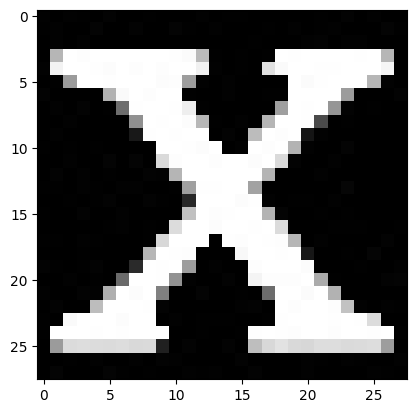

In [35]:
fig1.add_subplot(1,1,1)
plt.imshow(trainData[800][:])

In [36]:
X_train,X_val,y_train,y_val = train_test_split(trainData,trainLabel,test_size=0.1,random_state=42)

In [37]:
y_val
# from sklearn.preprocessing import LabelBinarizer
# label_as_binary = LabelBinarizer()
# y_train = label_as_binary.fit_transform(y_train)
# y_val = label_as_binary.fit_transform(y_val)

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

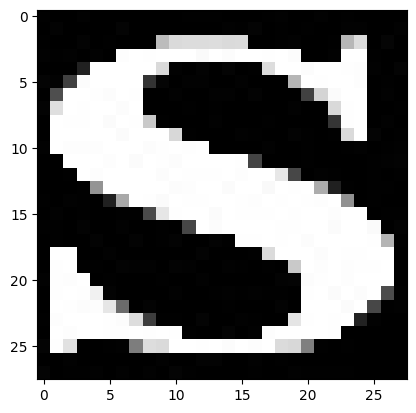

In [38]:
fig1.add_subplot(1,1,1)
plt.imshow(X_val[-1][:])

In [39]:
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
modelAlphaNum = Sequential()
modelAlphaNum.add(Conv2D(filters=32,kernel_size=(5,5),input_shape=(28,28,3),activation='relu'))
modelAlphaNum.add(MaxPooling2D(pool_size=(2,2)))
modelAlphaNum.add(Dropout(rate=0.4))
modelAlphaNum.add(Flatten())
modelAlphaNum.add(Dense(units=128,activation="relu"))
modelAlphaNum.add(Dense(units=36,activation="softmax"))
modelAlphaNum.summary()

In [40]:
modelAlphaNum.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
m=modelAlphaNum.fit(X_train,y_train,epochs=80,batch_size=32,validation_data=(X_val,y_val),verbose=1)

Epoch 1/80
25/25 [==============================] - 1s 21ms/step - loss: 2.3867 - accuracy: 0.3990 - val_loss: 0.7642 - val_accuracy: 0.7701
Epoch 2/80
25/25 [==============================] - 0s 18ms/step - loss: 0.4614 - accuracy: 0.8636 - val_loss: 0.3890 - val_accuracy: 0.9080
Epoch 3/80
25/25 [==============================] - 0s 18ms/step - loss: 0.1875 - accuracy: 0.9485 - val_loss: 0.0997 - val_accuracy: 0.9655
Epoch 4/80
25/25 [==============================] - 0s 18ms/step - loss: 0.0900 - accuracy: 0.9704 - val_loss: 0.0647 - val_accuracy: 0.9770
Epoch 5/80
25/25 [==============================] - 1s 21ms/step - loss: 0.0823 - accuracy: 0.9743 - val_loss: 0.1928 - val_accuracy: 0.9540
Epoch 6/80
25/25 [==============================] - 0s 19ms/step - loss: 0.1158 - accuracy: 0.9704 - val_loss: 0.1159 - val_accuracy: 0.9655
Epoch 7/80
25/25 [==============================] - 0s 18ms/step - loss: 0.0437 - accuracy: 0.9833 - val_loss: 0.0500 - val_accuracy: 0.9885
Epoch 8/80
25

Epoch 59/80
25/25 [==============================] - 0s 19ms/step - loss: 0.0047 - accuracy: 0.9987 - val_loss: 0.0833 - val_accuracy: 0.9655
Epoch 60/80
25/25 [==============================] - 0s 18ms/step - loss: 0.0139 - accuracy: 0.9949 - val_loss: 0.0630 - val_accuracy: 0.9885
Epoch 61/80
25/25 [==============================] - 0s 17ms/step - loss: 0.0041 - accuracy: 1.0000 - val_loss: 0.1010 - val_accuracy: 0.9655
Epoch 62/80
25/25 [==============================] - 0s 20ms/step - loss: 0.0066 - accuracy: 0.9961 - val_loss: 0.1595 - val_accuracy: 0.9655
Epoch 63/80
25/25 [==============================] - 0s 17ms/step - loss: 0.0058 - accuracy: 0.9987 - val_loss: 0.1720 - val_accuracy: 0.9655
Epoch 64/80
25/25 [==============================] - 0s 19ms/step - loss: 0.0148 - accuracy: 0.9923 - val_loss: 0.0739 - val_accuracy: 0.9885
Epoch 65/80
25/25 [==============================] - 0s 19ms/step - loss: 0.0167 - accuracy: 0.9949 - val_loss: 0.1220 - val_accuracy: 0.9540
Epoch 

In [41]:
test_loss,test_acc = modelAlphaNum.evaluate(valData,valLabel)
print(test_loss)
print(test_acc)

7/7 [==============================] - 0s 4ms/step - loss: 0.0099 - accuracy: 0.9954
0.009866775013506413
0.9953703880310059


In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12,8))
plt.plot(m.history['loss'],'r',label='train loss')
plt.plot(m.history['val_loss'],'b',label='validation loss')
plt.xlabel('No. of Epochs')
plt.ylabel('Loss')
plt.title('Loss Graph')
plt.legend()

In [ ]:
plt.figure(figsize=(12,8))
plt.plot(m.history['accuracy'],'r',label='train accuracy')
plt.plot(m.history['val_accuracy'],'b',label='validation accuracy')
plt.xlabel('No. of Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy Graph')
plt.legend()

In [ ]:
modelAlphaNum.save(os.path.join(os.getcwd(),'alphaNum.h5'))

In [43]:
import keras
model = keras.models.load_model("alphaNum.h5")

In [44]:
import numpy as np
imgDict0 = cv2.resize(imgDict[6],(28,28))
imgDict0 = imgDict0.reshape(1,28,28,3)
imgDict0 = imgDict0/255.0
pred = model.predict(imgDict0)[0]
final_pred = np.argmax(pred)
imgDict0 = str(final_pred)+' '+str(int(max(pred)*100))+"%"
print(imgDict0)

1/1 [==============================] - 0s 81ms/step
29 72%


1/1 [==============================] - 0s 15ms/step


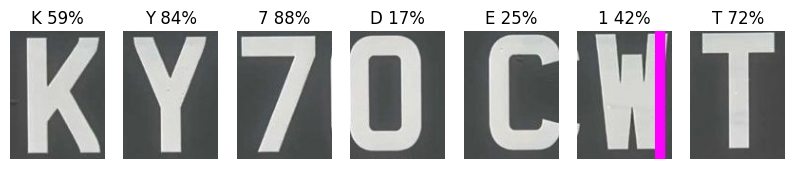

In [45]:
import pandas as pd
import os
df3 = pd.read_csv(os.path.join(os.getcwd(),"alphaNum_val.csv"))
values = []
for value in df3['labels']:
    if value not in values:
        values.append(value)
        
fig1 = plt.figure(figsize=(10,7))
row = 1
columns = len(imgDict)
        
for i,image in enumerate(imgDict):
    img = cv2.resize(image,(28,28))
    img = img.reshape(1,28,28,3)
    img = img/255.0
    pred = model.predict(img)[0]
    final_pred = np.argmax(pred)
    fig1.add_subplot(row,columns,i+1)
    plt.imshow(imgDict[i])
    plt.title(str(values[final_pred])+' '+str(int(max(pred)*100))+"%")
    plt.axis("off")